Sveučilište u Zagrebu<br>
Fakultet elektrotehnike i računarstva

# Strojno učenje
<a href="http://www.fer.unizg.hr/predmet/su">http://www.fer.unizg.hr/predmet/su</a>

Ak. god. 2015./2016.

# Laboratorijska vježba 3: Logistička regresija i SVM

(c) 2015 Jan Šnajder

*Verzija 0.1*

Objavljeno: **8. prosinca 2015.**<br>
Rok za predaju: **14-18. prosinca 2015.**

## Upute

Laboratorijska vježba 3 sastoji se od 12 zadataka. U nastavku slijedite upute navedene u ćelijama s tekstom. Rješavanje vježbe svodi se na **dopunjavanje ove bilježnice**: umetanja ćelije ili više njih **ispod** teksta zadatka, pisanja odgovarajućeg koda te evaluiranja ćelija. Odgovore na pitanja **nemojte pisati** u bilježnicu koju ćete demonstrirati asistentu (kako ih pri predaji ne bi samo čitali).

Osigurajte da u potpunosti **razumijete** kod koji ste napisali. Kod predaje vježbe, morate biti u stanju na zahtjev asistenta preinačiti i ponovno evaluirati Vaš kod. Nadalje, morate razumjeti teorijske osnove onoga što radite, u okvirima onoga što smo obradili na predavanju. Stoga se nemojte ograničiti samo na to da riješite zadatak, već slobodno eksperimentirajte. To upravo i jest svrha ovih vježbi.

Vježbe trebate raditi **samostalno**. Možete se konzultirati s drugima o načelnom načinu rješavanja, ali u konačnici morate sami odraditi vježbu. U protivnome vježba nema smisla.

In [1]:
import scipy as sp
import scipy.stats as stats
import matplotlib.pyplot as plt
import pandas as pd
%pylab inline

from __future__ import division

Populating the interactive namespace from numpy and matplotlib


Pomoćna funkcija za iscrtavanje ulaznog prostora primjera i granice između klasa:

In [2]:
def plot_problem(X, y, h=None, surfaces=True) :
    '''
    Plots a two-dimensional labeled dataset (X,y) and, if function h(x) is given, 
    the decision boundaries (surfaces=False) or decision surfaces (surfaces=True)
    '''
    assert X.shape[1] == 2, "Dataset is not two-dimensional"
    if h!=None : 
        # Create a mesh to plot in
        r = 0.02  # mesh resolution
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, r),
                             np.arange(y_min, y_max, r))
        XX=np.c_[xx.ravel(), yy.ravel()]
        try:
            Z_test = h(XX)
            if shape(Z_test) == () :
                # h returns a scalar when applied to a matrix; map explicitly
                Z = sp.array(map(h,XX))
            else :
                Z = Z_test
        except ValueError:
            # can't apply to a matrix; map explicitly
            Z = sp.array(map(h,XX))
        # Put the result into a color plot
        Z = Z.reshape(xx.shape)
        if surfaces :
            plt.contourf(xx, yy, Z, cmap=plt.cm.Pastel1)
        else :
            plt.contour(xx, yy, Z)
    # Plot the dataset
    scatter(X[:,0],X[:,1],c=y, cmap=plt.cm.Paired,marker='o',s=50);

Ogledni skup podataka koji se sastoji od sedam primjera:

In [3]:
seven_X = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3]])
seven_y = sp.array([1,1,1,1,-1,-1,-1])

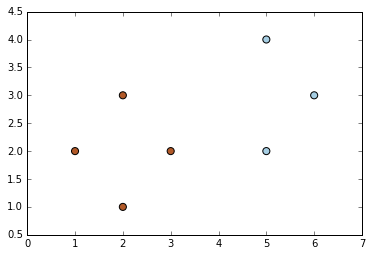

In [4]:
plot_problem(seven_X, seven_y)

## Zadatci

### 1. Implementacija logističke regresije

### (a)

Definirajte logističku (sigmoidalnu) funkciju $\mathrm{sigm}(x)=\frac{1}{1+\exp(-\alpha x)}$ i prikažite je za $\alpha\in\{1,2,4\}$.

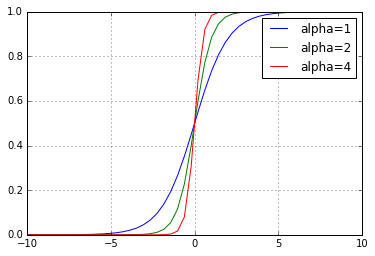

In [5]:
def sigmoid(x, alpha): 
    return 1/(1 + sp.exp(-alpha*x))

alpha = [1, 2, 4]
x = np.linspace(-10, 10)

for a in alpha: 
    plt.plot(x, sigmoid(x, a),  label='alpha={}'.format(str(a)))
    plt.grid(True)
    plt.legend()
    
# Sigmoidalna funkcija je prikladan izbor jer funkcija preslikava sve realne brojeve u konačan interval [0,1] + 
# njezina derivacija je analitički vrlo pogodna

# Nagib sigmoide može se regulirati množenjem ulaza određenim faktorom (alfa)
# Povećavanjem alfa sigmoida postaje strmija, njezini izlazi biti će sve bliži vrijednosti 0 i 1 i na taj način 
# se gubi blagi prijelaz između klasa

# Pitanje je bilo što se dogodi ako se postavi veliki lambda(regularaizacijski faktor) ?
# Tada će on utjecat na težine i one će biti smanjenje što odgovara ovom alfa kad je manji pa 
# će sigmoida biti manje strmija i polegnutija

**Q**: Zašto je sigmoidalna funkcija prikladan izbor za aktivacijsku funkciju poopćenoga linearnog modela?

**Q**: Kakav utjecaj ima faktor $\alpha$ na oblik sigmoide? Što to znači za model logističke regresije (tj. kako aposteriorna vjerojatnost $P(\mathcal{C}_j|\mathbf{x})$ ovisi o magnitudi vektora težina $\mathbf{w}$)?

### (b)

Implementirajte funkciju 

> `lr_train(X, y, eta=0.01, max_iter=2000, alpha=0, epsilon=0.0001, trace=False)` 

za treniranje modela logističke regresije gradijentnim spustom (*batch* izvedba). Funkcija uzima označeni skup primjera za učenje (matrica primjera `X` i vektor oznaka `y`) te vraća $(n+1)$-dimenzijski vektor težina tipa `ndarray`. Ako je `trace=True`, funkcija dodatno vraća listu (ili matricu) vektora težina $\mathbf{w}^0,\mathbf{w}^1,\dots,\mathbf{w}^k$ generiranih kroz sve iteracije optimizacije, od 0 do $k$. Optimizaciju treba provoditi dok se ne dosegne `max_iter` iteracija, ili kada razlika u pogrešci unakrsne entropije između dviju iteracija padne ispod vrijednosti `epsilon`. Parametar `alpha` predstavlja faktor regularizacije.

Definirajte pomoćnu funkciju `lr_h(x,w)` koja daje predikciju (aposteriornu vjerojatnost) za primjer `x` uz zadane težine `w`.

**NB:** Obratite pozornost na to da je način kako su definirane oznake ($\{+1,-1\}$ ili $\{1,0\}$) kompatibilan s izračunom funkcije gubitka u optimizacijskome algoritmu. Prilagodite algoritam ili jednostavno redefinirajte oznake u skupu `seven`.

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from __future__ import division
from sklearn.metrics import log_loss

# Helper functions 
# Sigmoid
def sigm(x): return 1 / (1 + sp.exp(-x))

# calculating hyptothesis h 
def lr_h(x,w): return sigm(np.dot(w, x))

# cross entropy loss function
def cross_entropy_loss(h_x, y): return -y * sp.log(h_x) - (1 - y) * sp.log(1 - h_x)


class Logistic_Regression:
    w = []

    def lr_predict(self, x):
        x = self.p.transform(x)
        x = np.squeeze(np.asarray(x))
        return sigm(np.dot(self.w, x))
    
    # Logistic regression with regularization training using batch gradient descent
    # alpha is regularization factor
    # eta is learning rate
    def lr_train(self, X, y, p, eta=0.01, max_iter=2000, alpha=0, epsilon=0.0001, trace=False):
        n = X.shape[1] # col
        N = X.shape[0] # rows        
        w0 = 0
        w = np.zeros(n)
        w_vector = np.hstack((w0,w))
        iter_count = 0
        trace_list = []
        trace_list.append(w_vector)
        converged = False
        error = 100.0
        self.p = p
        
        # iteration loop
        while not converged:
            dw0 = 0
            dw = np.zeros(n)
        
            # batch gradient descent
            for i in range(N):
                h = sigm(w_vector.T.dot(sp.hstack((sp.array([1]), X[i] )))) 
                dw0 = dw0 + (h - y[i])
                dw = dw + np.dot((h - y[i]), X[i]) 
                
            # update
            w0 = w0 - eta*dw0
            w = w*(1-eta*alpha)-eta*dw
            w_vector = sp.hstack((w0,w))
            if(trace): trace_list.append(w_vector)
            iter_count += 1

            # cross entropy error
            y_predicted = []
            for i in range(N):
                y_p = lr_h(sp.hstack((sp.array([1]),X[i])), w_vector)
                y_predicted.append(y_p)          
            error_temp = log_loss(y, y_predicted)
            
            # when the difference in the cross-entropy error between two iterations falls below the value of epsilon
            if abs(error-error_temp) <= epsilon:
                print 'Converged, difference between cross-entropy error of 2 iterations is below value of epsilon, at iteration number: ', iter_count
                converged = True
            
            # update error
            error = error_temp    
            
            # optimization should be carried out until it reaches max_iter iteration
            if (iter_count == max_iter): 
                print 'Max interactions exceeded!'
                converged = True
                
        print "alpha = ", alpha    
        print "w = ", w_vector
        self.w = w_vector
        if(trace):             
            return w_vector, trace_list
        else:
            return w_vector
        
# Problem s izračunavanjem cross entropy errora !
lr = Logistic_Regression()
p = PolynomialFeatures(degree=1)
lr.lr_train(seven_X, seven_y, p, eta=0.01, max_iter=2000, alpha=0, epsilon=0.0001, trace=False)

design_X = p.fit_transform(seven_X)
   

plot_problem(seven_X, seven_y, lr.lr_predict)

Converged, difference between cross-entropy error of 2 iterations is below value of epsilon, at iteration number:  374
alpha =  0
w =  [  3.60592044 -30.24944203  -4.02679732]


/Users/filipzelic/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
/Users/filipzelic/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
/Users/filipzelic/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

### (c)

Definirajte fukciju `cross_entropy_error(X,y,w)` koja izračunava pogrešku unakrsne entropije modela na označenom skupu `(X,y)`. Možete iskoristiti funkciju [`metrics.log_loss`](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.log_loss.html).

In [7]:
from sklearn.metrics import log_loss


# calculating error
def cross_entropy_error_no_regularization(X, y, w):
    N = len(y)
    error = 0.0
    for i in range(N):
        hx = sigm(lr_h( sp.hstack((sp.array([1]),X[i])), w))
        error += cross_entropy_loss(hx, y[i])
    return error

w = lr.lr_train(seven_X, seven_y, eta=0.01, max_iter=2000, alpha=0, epsilon=0.0001, trace=False)
cross_error = cross_entropy_error_no_regularization(seven_X, seven_y, w)
print cross_error


Converged, difference between cross-entropy error of 2 iterations is below value of epsilon, at iteration number:  374
alpha =  0
w =  [  3.60592044 -30.24944203  -4.02679732]
4.85203026392


### (d)

Koristeći funkciju `lr_train`, trenirajte model logističke regresije na skupu `seven`, prikažite dobivenu granicu između klasa te  izračunajte pogrešku unakrsne entropije.

In [8]:
# ovisi o 1 b)

**Q:** Jeste li dobili granicu između klasa kakvu ste očekivali dobiti pomoću logističke regresije? Obrazložite.

**Q:** Koji kriterij zaustavljanja je aktiviran?

**Q:** Zašto dobivena pogreška unakrsne entropije nije jednaka nuli?

**Q:** Kako biste utvrdili da je optimizacijski postupak doista pronašao hipotezu koja minimizira pogrešku učenja? O čemu (o kojim parametrima) to ovisi?

**Q:** Na koji način biste preinačili kod ako biste htjeli da se optimizacija izvodi stohastičkim gradijentnim spustom (*online learning*)?

### (e)

Prikažite na jednom grafikonu pogrešku unakrsne entropije (očekivanje logističkog gubitka) i pogrešku klasifikacije (očekivanje gubitka 0-1) na skupu `seven` kroz iteracije optimizacijskog postupka. Koristite trag težina funkcije `lr_train` iz zadatka (b) (opcija `trace=True`). Za izračun pogreške možete koristiti funkciju [`metrics.zero_one_loss`](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.zero_one_loss.html#sklearn.metrics.zero_one_loss). Na drugom grafikonu prikažite pogrešku unakrsne entropije kao funkciju broja iteracija za različite stope učenja, $\eta\in\{0.005,0.01,0.05,0.1\}$.

In [9]:
# ovisi o 1 b)

from sklearn.metrics import zero_one_loss

eta_list = [0.005,0.01,0.05,0.1]

for eta in eta_list: 
    pass


**Q:** Zašto je pogreška unakrsne entropije veća od pogreške klasifikacije? Je li to uvijek slučaj kod logističke regresije i zašto?

**Q:** Koju stopu učenja $\eta$ biste odabrali i zašto?

### (f)

Upoznajte se s klasom [`linear_model.LogisticRegression`](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html) koja implementira logističku regresiju. Usporedite rezultat modela na skupu `seven` s rezultatom koji dobivate pomoću vlastite implementacije algoritma.

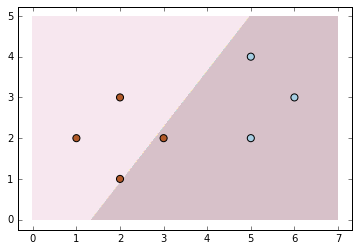

In [10]:
from sklearn.linear_model import LogisticRegression

seven_X = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3]])
seven_y = sp.array([1,1,1,1,-1,-1,-1])
#plot_problem(seven_X, seven_y)

logisticRegresion = LogisticRegression()
logisticRegresion.fit(seven_X, seven_y)

plot_problem(seven_X, seven_y, h=logisticRegresion.predict)

# Kada se postavi npr C=1000 u logisticregression izgleda bolje model -> sličan svm-u

**Q:** Ako se rezultat razlikuje, pokušajte obrazložiti zašto je to tako.

### 2. Analiza logističke regresije

### (a)

Dodajte u skup `seven` jednu vrijednost koja odskače od ostalih. Provjerite koliko je model logističke regresije robustan na vrijednosti koje odskaču. Prikažite granicu između klasa.

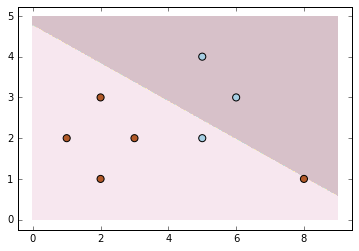

In [11]:
from sklearn.linear_model import LogisticRegression

modified_X = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3],[8,1]])
modified_y = sp.array([1,1,1,1,-1,-1,-1, 1])

clf_model = LogisticRegression()
clf_model.fit(modified_X, modified_y)
plot_problem(modified_X, modified_y, h=clf_model.predict)



**Q:** Usporedite rezultat s onime za model linearne regresije iz druge laboratorijske vježbe, zadatak (8b). Obrazložite zašto se rezultat razlikuje.

### (b)

Trenirajte model logističke regresije na skupu `seven` te na dva odvojena grafikona prikažite (1) aposteriornu vjerojatnost $P(\mathcal{C}|\mathbf{x})$ za svih sedam primjera te (2) vrijednosti težina $w_0$, $w_1$, $w_2$ kroz iteracije optimizacijskoga algoritma. 




In [12]:
# ovisi o 1 b)

### (c)

Preinačite skup `seven` tako da on više ne bude linearno odvojiv. Trenirajte model logističke regresije na takvom skupu te prikažite oba grafikona iz zadatka (b).

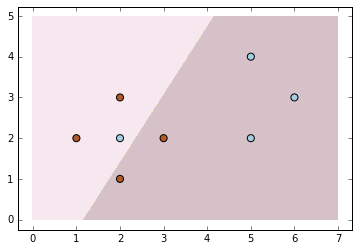

In [13]:
from sklearn.linear_model import LogisticRegression

seven_X_new = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3],[2,2]])
seven_y_new = sp.array([1,1,1,1,-1,-1,-1,-1])
#plot_problem(seven_X, seven_y)

logisticRegresion = LogisticRegression()
logisticRegresion.fit(seven_X_new, seven_y_new)

plot_problem(seven_X_new, seven_y_new, h=logisticRegresion.predict)

**Q:** Usporedite grafikone za slučaj linearno odvojivih i linearno neodvojivih primjera te komentirajte razliku.

### 3. Regularizirana logistička regresija

### (a)

Trenirajte model logističke regresije na skupu `seven` s različitim faktorima L2-regularizacije, $\alpha\in\{0,1,10,100\}$. Prikažite (1) pogrešku unakrsne entropije te (2) L2-normu vektora $\mathbf{w}$ kroz iteracije optimizacijskog algoritma.

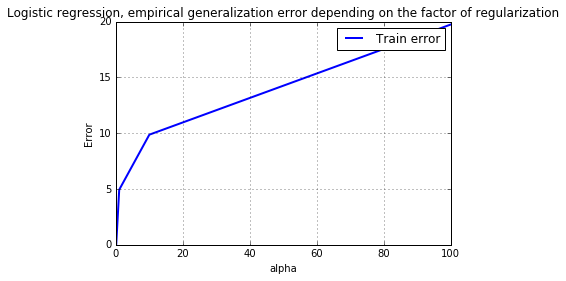

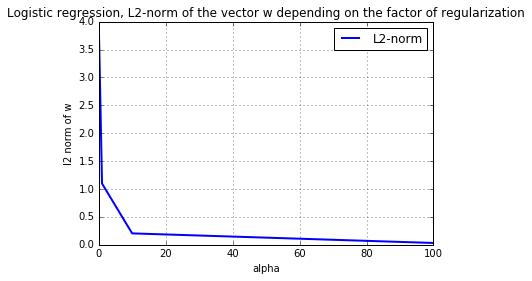

In [14]:
from sklearn.linear_model import LogisticRegression
from __future__ import division
from sklearn.metrics import log_loss

alphs = [0.1, 1, 10, 100]
seven_X = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3]])
seven_y = sp.array([1,1,1,1,-1,-1,-1])
error_list = []
l2_norm = []

for a in alphs: 
    clf = LogisticRegression(C=(1/a), penalty='l2')
    clf.fit(seven_X, seven_y)
    y_predicted = clf.predict(seven_X)
    
    w = np.insert(clf.coef_, 0, clf.intercept_)
    l2_w = np.linalg.norm(w)
    l2_norm.append(l2_w)
    cross_entropy_error = log_loss(seven_y, y_predicted)
    error_list.append(cross_entropy_error)

plt.plot(alphs, error_list, label="Train error" , linewidth=2)
plt.xlabel('alpha')
plt.ylabel('Error')
plt.title('Logistic regression, empirical generalization error depending on the factor of regularization')
plt.legend(loc ='upper right')
plt.grid(True)
plt.show()

plt.plot(alphs, l2_norm, label="L2-norm", linewidth=2)
plt.xlabel('alpha')
plt.ylabel('l2 norm of w')
plt.title('Logistic regression, L2-norm of the vector w depending on the factor of regularization')
plt.legend(loc ='upper right')
plt.grid(True)
plt.show()    

# Paziti ovdje bolje skicirati iz naše lr_train funkcije prema trace listi !

**Q:** Jesu li izgledi krivulja očekivani i zašto?

**Q:** Koju biste vrijednost za $\alpha$ odabrali i zašto?

### 4. Logistička regresija s funkcijom preslikavanja

### (a)

Proučite funkciju [`datasets.make_classification`](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_classification.html). Generirajte i prikažite dvoklasan skup podataka s ukupno $N=100$ dvodimenzijskih ($n=2)$ primjera, i to sa dvije grupe po klasi (`n_clusters_per_class=2`). Malo je izgledno da će tako generiran skup biti linearno odvojiv, međutim to nije problem jer primjere možemo preslikati u višedimenzijski prostor značajki pomoću klase [`preprocessing.PolynomialFeatures`](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html), kao što smo to učinili kod linearne regresije u drugoj laboratorijskoj vježbi. Trenirajte model logističke regresije koristeći za preslikavanje u prostor značajki polinomijalnu funkciju stupnja $d=2$ i stupnja $d=3$. Prikažite dobivene granice između klasa. Možete koristiti svoju implementaciju, ali se radi brzine preporuča koristiti `linear_model.LogisticRegression`. Regularizacijski faktor odaberite po želji.

**NB:** Kao i ranije, za prikaz granice između klasa koristite funkciju `plot_problem`. Funkciji kao argumente predajte izvorni skup podataka, a preslikavanje u prostor značajki napravite unutar poziva funkcije `h` koja čini predikciju, na sljedeći način:

In [15]:
from sklearn.datasets import make_classification

data_X, data_y = make_classification(n_samples=100, n_features=2, n_informative=2, n_redundant=0, 
                           n_repeated=0, n_classes=2, n_clusters_per_class=2)

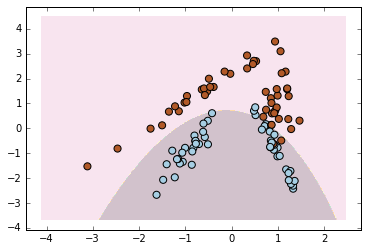

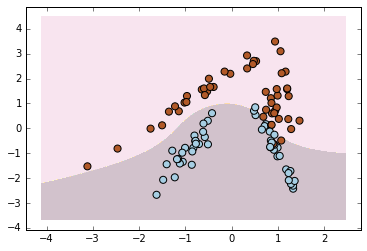

In [16]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LogisticRegression

# degree = 2
poly2 = PolynomialFeatures(degree=2)
poly2_data_X = poly2.fit_transform(data_X)
model2 = LogisticRegression()
model2.fit(poly2.transform(data_X), data_y)
plot_problem(data_X, data_y, lambda x : model2.predict(poly2.transform(x)))
plt.show()

# degree = 3
poly = PolynomialFeatures(degree=3)
data_3_X = poly.fit_transform(data_X)
model = LogisticRegression()
model.fit(data_3_X, data_y)
plot_problem(data_X, data_y, lambda x : model.predict(poly.transform(x)))
plt.show()

# Bolji model je onaj 2.stupnja jer se model 3.stupnja prenaučeni tj previše prilagodi podacima

**Q:** Koji biste stupanj polinoma upotrijebili i zašto? Je li taj odabir povezan s odabirom regularizacijskog faktora $\alpha$? Zašto?

### (b)

Podijelite skup podataka iz zadatka (a) na **skup za treniranje** i **skup za ispitivanje** u omjeru 7:3 (možete koristiti funkciju [`cross_validation.train_test_split`](http://scikit-learn.org/stable/modules/generated/sklearn.cross_validation.train_test_split.html). Na skupu za učenje trenirajte model logističke regresije s polinomom četvrtog stupnja ($d=4$) kao funkcijom preslikavanja. Prikažite empirijsku pogrešku i pogrešku generalizacije u ovisnosti o faktoru regularizacije, i to kao funkciju parametra $C$ (inverz faktora regularizacije) za $C=2^\alpha$, gdje $\alpha\in\{-8,-7,\dots,7,8\}$.

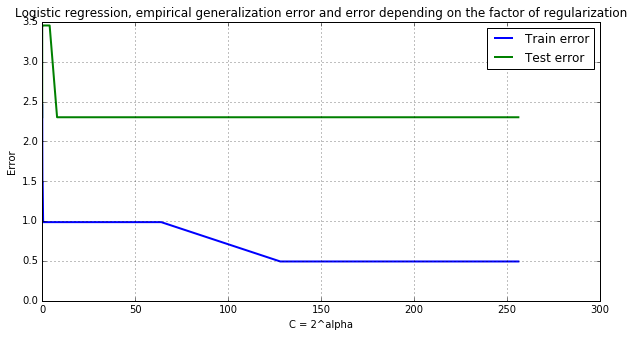

In [17]:
from sklearn.cross_validation import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss 
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5   # 10 inches in width, 5 in height

X_train, X_test, y_train, y_test = train_test_split(data_X, data_y, test_size=0.3, random_state=42)

poly_d4 = PolynomialFeatures(degree=4)
X_train_mapped = poly_d4.fit_transform(X_train)
X_test_mapped = poly_d4.fit_transform(X_test)

c_list = []
error_train = []
error_test = []
alpha_list = range(-8, 9)

for a in alpha_list:
    c = pow(2,a)
    c_list.append(c)
    log_reg_model = LogisticRegression(C=c)
    log_reg_model.fit(X_train_mapped, y_train)

    predict_train = log_reg_model.predict(X_train_mapped)
    predict_test = log_reg_model.predict(X_test_mapped)
    
    # Log loss, also called logistic regression loss or cross-entropy loss, is defined on probability estimates.
    empirijska_pogreska = log_loss(y_train, predict_train)
    pogreska_generalizacije = log_loss(y_test, predict_test)
    
    error_train.append(empirijska_pogreska)
    error_test.append(pogreska_generalizacije)
    
    
plt.plot(c_list, error_train, label="Train error" , linewidth=2)
plt.plot(c_list, error_test, label="Test error", linewidth=2)   
plt.xlabel('C = 2^alpha')
plt.ylabel('Error')
plt.title('Logistic regression, empirical generalization error and error depending on the factor of regularization')
plt.legend(loc ='upper right')
plt.grid(True)
plt.show() 

# Lijevi kraj je podnaučenost jer kada lambda raste , model postaje jednostavniji ( c = 1/ lambda ) dakle model je 
# jednostavniji kada C pada tj ima jako malu vrijednost 

# Desni kraj je prenaučenost jer lambda pada -> C raste -> složeni model 

# Odabrali bismo alfa = 7 to je dio na grafu kada je test error malo veća od train error, to bi odgovarao
# optimalnom modelu 

# Rezultati NISU STABILNI, postali bi malo stabiliniji kada bi generirali podatke 40 puta i npr uzeli srednje vrijednosti pogrešaka
# Graf se mijenja porpilično ponovnim generiranjem podatak

**Q:** Kojem dijelu u grafikonu odgovara prenaučenost, a kojem podnaučenost? Zašto?

**Q:** Koji biste faktor $\alpha$ odabrali i zašto?

**Q:** Koliko su ovi rezultati stabilni? Ako mislite da nisu, objasnite što je mogući uzrok. Predložite kako bismo mogli dobiti stabilnije rezultate.

### 5. Klasifikator SVM

### (a)

Upoznajte se s klasom [`svm.SVC`](http://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC), koja ustvari implementira sučelje prema implementaciji [`libsvm`](http://www.csie.ntu.edu.tw/~cjlin/libsvm/). Primijenite model `SVC` s linearnom jezgrenom funkcijom (tj. bez preslikavanja primjera u prostor značajki) na skup podataka `seven`. Prikažite dobivenu granicu između klasa, ispišite koeficijente $w_0$ i $\mathbf{w}$ te izračunajte širinu margine. Ispišite dualne koeficijente i potporne vektore.

In [18]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5   # 10 inches in width, 5 in height

seven_X = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3]])
seven_y = sp.array([1,1,1,1,-1,-1,-1])

# Linear kernel for SVM
classificator_SVM = SVC(kernel='linear')
classificator_SVM.fit(seven_X, seven_y)
w0 = classificator_SVM.intercept_
w = classificator_SVM.coef_
print "Koeficijenti w: ", w0, w
print "Sirina margine: ", 2/sp.linalg.norm(classificator_SVM.coef_)
print "Dualni koeficijenti (alfe): ", classificator_SVM.dual_coef_
print "Potporni vektori prema indexu u training setu: ", classificator_SVM.support_
print "Potporni vektori: "
print classificator_SVM.support_vectors_

Koeficijenti w:  [ 3.99951172] [[ -9.99707031e-01  -2.92968750e-04]]
Sirina margine:  2.00058602331
Dualni koeficijenti (alfe):  [[ -4.99707031e-01  -1.46484375e-04   4.99853516e-01]]
Potporni vektori prema indexu u training setu:  [4 5 3]
Potporni vektori: 
[[ 5.  2.]
 [ 5.  4.]
 [ 3.  2.]]


### (b) 

Prisjetite se da $h(\mathbf{x})=\mathbf{w}^\intercal\tilde{\mathbf{x}}$ odgovara udaljenosti primjera $\mathbf{x}$ od granice definirane sa $h(\mathbf{x})=0$. Provjerite da je upravo to vrijednost koju izračunava funkcija `svm.decision_function`. Preinačite funkciju `plot_problem` tako da, uz granicu između klasa, prikazuje i marginu.


In [ ]:
def predict(model,x) : 
    h = model.decision_function(x)
    if h >= -1 and h <= 1 : return 0.5
    else : return max(-1,min(1,h))
    return h


plot_problem(seven_X, seven_y, lambda x: predict(classificator_SVM,x)); show()

# Margina iznosi  2.00117222 što odgovara 2/(||w||) jer je udaljenost primjera s jedne strane do margine 1/(||w||)
# prema ograničenju koje svi primjeri moraju zadovoljavati -> y_i*(w*x_i+w0)>=1

# Potporni vektori su primjeri  4(5.  2.), 5(5.  4.) 3(3.  2.) zato jer su za njih vrijedi y_i*(w*x_i+w0)==1

/Users/filipzelic/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
/Users/filipzelic/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
/Users/filipzelic/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a


**Q:** Koliko iznosi širina margine i zašto?

**Q:** Koji primjeri su potporni vektori i zašto?

### (c)

Definirajte funkciju `hinge(model,x,y)` koja izračunava gubitak zglobnice modela SVM na primjeru `x`. Izračunajte gubitke modela naučenog na skupu `seven` za primjere $\mathbf{x}^{(1)}=(3,2)$, $\mathbf{x}^{(2)}=(3.5,2)$ i $\mathbf{x}^{(3)}=(4,2)$ koji su označeni pozitivno ($y=1$). Također izračunajte prosječni gubitak SVM-a na skupu `seven`. Uvjerite se da je rezultat identičan onome koji biste dobili primjenom ugrađene funkcije [`metrics.hinge_loss`](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.hinge_loss.html). 

In [ ]:
from sklearn.metrics import hinge_loss
from __future__ import division
x1 = [3,2]
x2 = [3.5,2]
x3 = [4,2]
y = 1

def hinge(model, x, y):
    return max(0, (1-np.dot(y,model.decision_function(x))))

# classificator_SVM fit to seven_X, seven_y
print "Hinge loss x1(3,2): ", hinge(classificator_SVM,x1,y)
print "Hinge loss x1(3.5,2): ", hinge(classificator_SVM,x2,y)
print "Hinge loss x1(4,2): ", hinge(classificator_SVM,x3,y)

# Mean hinge loss for seven set
sum_loss = 0
N = len(seven_X)
for i in range(N):
    temp =  hinge(classificator_SVM, seven_X[i], seven_y[i])
    sum_loss += temp
mean_hinge_loss = (1/N)*sum_loss

print "Mean hinge loss for seven set: ", mean_hinge_loss
print "Function from metrics.hinge_loss: ", hinge_loss(seven_y,classificator_SVM.decision_function(seven_X))

### 6. Usporedba linearnih modela

### (a)

Trenirajte na skupu `seven` tri linearna modela: perceptron, logističku regresiju i linearan SVM. Prikažite dobivenu granicu između klasa za sva tri modela. 

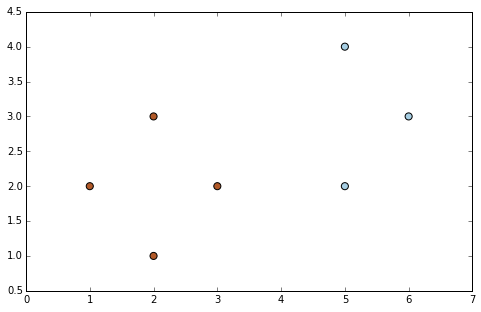

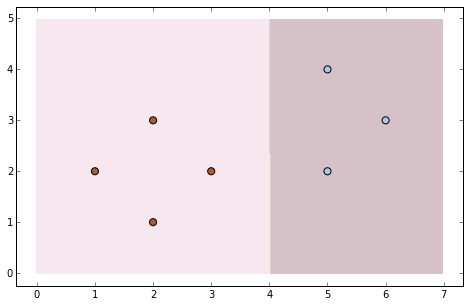

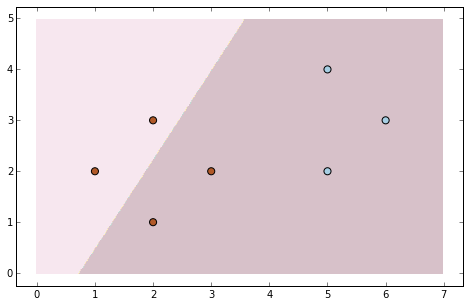

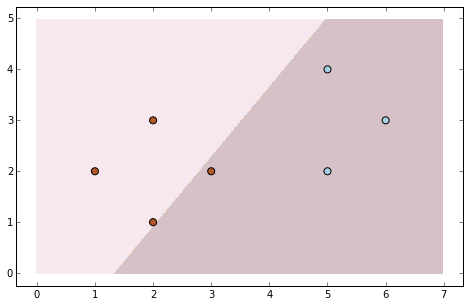

In [37]:
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.svm import SVC

seven_X = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3]])
seven_y = sp.array([1,1,1,1,-1,-1,-1])
plot_problem(seven_X, seven_y)
plt.show()

# Linear kernel for SVM
classificator_SVM = SVC(kernel='linear')
classificator_SVM.fit(seven_X, seven_y)
plot_problem(seven_X, seven_y, h=classificator_SVM.predict)
plt.show()

# Perceptron 
perceptron = Perceptron()
perceptron.fit(seven_X, seven_y)
plot_problem(seven_X, seven_y, h=perceptron.predict)
plt.show()

#Logistic regression
logisitic_reg = LogisticRegression()
logisitic_reg.fit(seven_X, seven_y)
plot_problem(seven_X, seven_y, h=logisitic_reg.predict)
plt.show()

### (b)

Ponovite treniranje gornjih triju modela na skupu s dodatnim, osmim primjerom koji odskače te prikažite opet dobivene granice između klasa za sva tri modela.

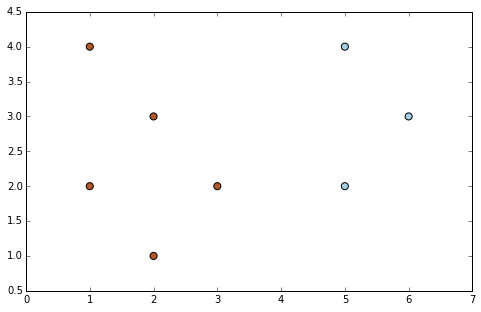

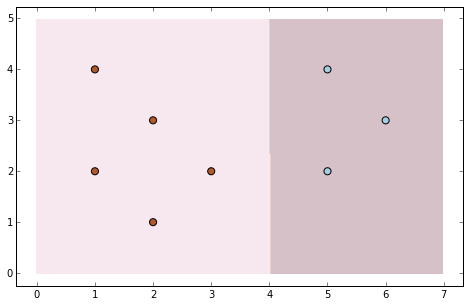

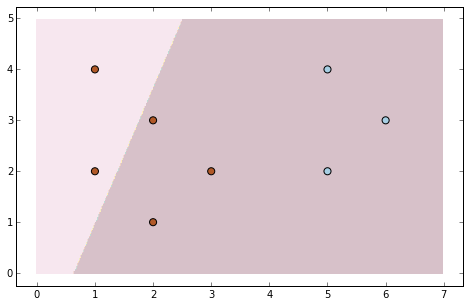

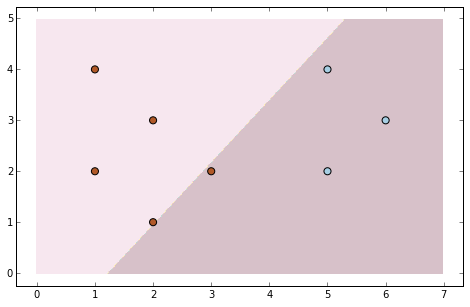

In [38]:
seven_X_newExample = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3],[1,4]])
seven_y_newExample = sp.array([1,1,1,1,-1,-1,-1,1])
plot_problem(seven_X_newExample, seven_y_newExample)
plt.show()

# Linear kernel for SVM
classificator_SVM = SVC(kernel='linear')
classificator_SVM.fit(seven_X_newExample, seven_y_newExample)
plot_problem(seven_X_newExample, seven_y_newExample, h=classificator_SVM.predict)
plt.show()

# Perceptron 
perceptron = Perceptron()
perceptron.fit(seven_X_newExample, seven_y_newExample)
plot_problem(seven_X_newExample, seven_y_newExample, h=perceptron.predict)
plt.show()

#Logistic regression
logisitic_reg = LogisticRegression()
logisitic_reg.fit(seven_X_newExample, seven_y_newExample)
plot_problem(seven_X_newExample, seven_y_newExample, h=logisitic_reg.predict)
plt.show()

# Za SVM je očekivano da se granice ne pomiče ako dodajemo nove vektore koji nisu ni blizu potpornim vektorima
# Perceptron se pomaknuo jer ovisi o redoslijedu primjera koji mu dajemo 
# Logistička regresija se isto pomaknula, ali minimalno jer "jako" točno klasificirani primjeri jako malo utječu
# utječu na granicu, ali svejedno utječu (nikad njihov utjecaj neće biti 0 -> vidimo iz loss funkcije) 

**Q:** Jesu li rezultati očekivani? Obrazložite.

### 7. Nelinearan SVM

Razmotrimo sljedeći linearno nedovojiv skup podataka:

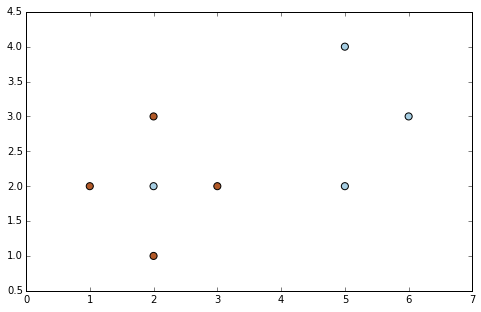

In [39]:
seven_X = sp.array([[2,1],[2,3],[1,2],[3,2],[5,2],[5,4],[6,3]])
seven_y = sp.array([1,1,1,1,-1,-1,-1])

X2, y2 = sp.append(seven_X, [[2,2]], axis=0), sp.append(seven_y, -1)
plot_problem(X2, y2)
plt.show()

Na tom skupu trenirajte tri modela SVM s različitim jezgrenim funkcijama: linearnom, polinomijalnom i radijalnom baznom (RBF) funkcijom. Varirajte parametar $C$ po vrijednostima $C\in\{10^{-2},1,10^2\}$, dok za ostale parametre (stupanj polinoma za polinomijalnu jezgru odnosno parametar $\gamma$ za jezgru RBF) koristite podrazumijevane vijednosti. Prikažite granice između klasa (i margine) na grafikonu organiziranome u polje $3x3$, gdje su stupci različite jezgre, a retci različite vrijednosti parametra $C$.

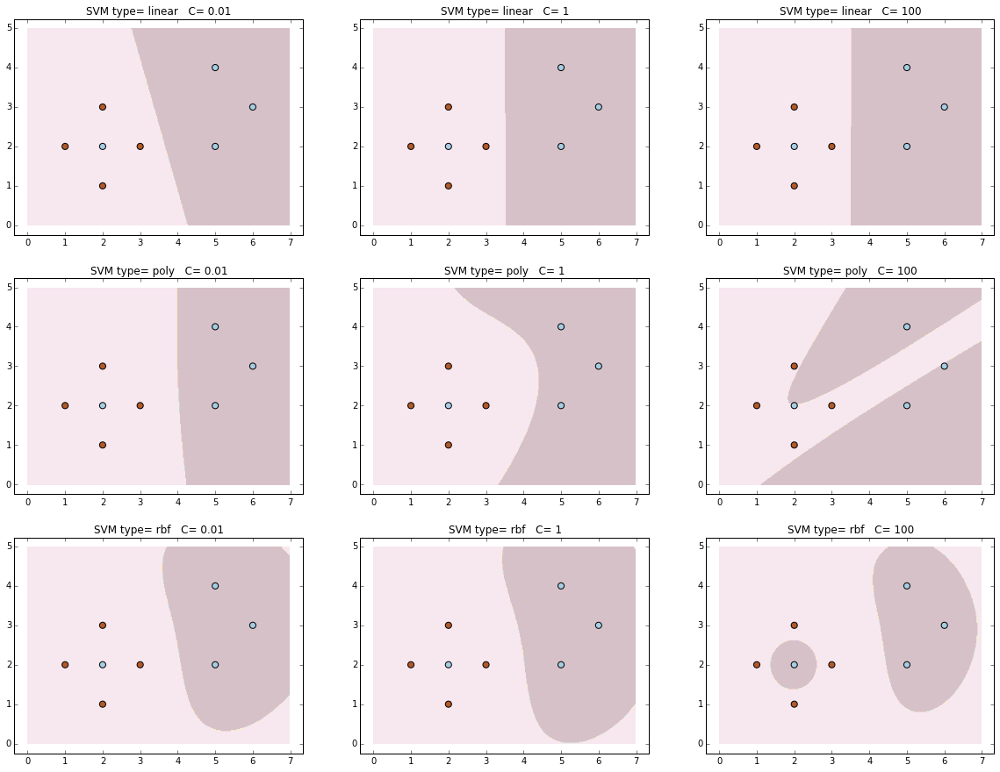

In [41]:
from pylab import rcParams
rcParams['figure.figsize'] = 20, 15   # 10 inches in width, 5 in height

C_parameters = [0.01,1,100]
SVM_list = ['linear', 'poly', 'rbf']

graph_count = 1
for svm_type in SVM_list:
    for c in C_parameters:
        svc = SVC(kernel=svm_type, C=c)
        svc.fit(X2, y2)
        subplot(3,3,graph_count)
        plot_problem(X2, y2, h=svc.predict)
        plt.title("SVM type= {}   C= {}".format(svm_type, c))
        plt.legend()
        graph_count += 1

# Polinomial kernel -> default degree = 3
# Model s manjim C će dozvoljavati više pogrešaka jer je manja težina kod računanja prelaska iz margina
# i tada će model biti Jednostavniji 
# Kada povećavamo C više kažnjavamo pogreške i model će biti dosta složeniji (zadnja slika najbolji primjer)

### 8. Optimizacija hiperparametara SVM-a

Pored hiperparametra $C$, model SVM s jezgrenom funkcijom RBF ima i dodatni hiperparametar $\gamma=\frac{1}{2\sigma^2}$ (preciznost). Taj parametar također određuje složenost modela: velika vrijednost za $\gamma$ znači da će RBF biti uska, primjeri će biti preslikani u prostor u kojem su (prema skalarnome produktu) međusobno vrlo različiti, što će rezultirati složenijim modelima. Obrnuto, mala vrijednost za $\gamma$ znači da će RBF biti široka, primjeri će biti međusobno sličniji, što će rezultirati jednostavnijim modelima. To ujedno znači da, ako odabremo veći $\gamma$, trebamo jače regularizirati model, tj. trebamo odabrati manji $C$, kako bismo spriječili prenaučenost. Zbog toga je potrebno zajednički optimirati hiperparametre $C$ i $\gamma$, što se tipično radi iscrpnim pretraživanjem po rešetci (engl. *grid search*). 

Definirajte funkciju 

> `grid_search(model, X_train, X_validate, y_train, y_validate, (c1,c2), (g1,g2), error_surface=False)` 

koja optimizira parametre $C$ i $\gamma$ pretraživanjem po rešetci. Funkcija treba pretražiti parametre $C\in\{2^{c_1},2^{c_1+1},\dots,2^{c_2}\}$ i $\gamma\in\{2^{g_1},2^{g_1+1},\dots,2^{g_2}\}$. Funkcija treba vratiti optimalne parametre $(C^*,\gamma^*)$, tj. one za koje na skupu za provjeru model ostvaruju najmanju pogrešku. Dodatno, ako je `surface=True`, funkcija treba vratiti matrice (tipa `ndarray`) pogreške modela (očekivanje gubitka 0-1) na skupu za učenje i skupu za provjeru. Svaka je matrica dimenzija $(c_2-c_1+1)\times(g_2-g_1+1)$ (retci odgovaraju različitim vrijednostima za $C$, a stupci različitim vrijednostima za $\gamma$).

Pomoću funkcije `datasets.make_classification` generirajte **dva** skupa podataka od $N=200$ primjera: jedan s $n=2$ dimenzije i drugi s $n=1000$ dimenzija. Primjeri neka dolaze iz dviju klasa, s time da svakoj klasi odgovaraju dvije grupe (`n_clusters_per_class=2`), kako bi problem bio nešto složeniji, tj. nelinearniji. Podijelite skup primjera na skup za učenje i skup za ispitivanje u omjeru 1:1.

In [80]:
from sklearn.datasets import make_classification
from sklearn.cross_validation import train_test_split

Na oba skupa optimirajte SVM s jezgrenom funkcijom RBF, u rešetci $C\in\{2^{-5},2^{-4},\dots,2^{15}\}$ i $\gamma\in\{2^{-15},2^{-14},\dots,2^{3}\}$. Prikažite površinu pogreške modela na skupu za učenje i skupu za provjeru, i to na oba skupa podataka (ukupno četiri grafikona) te ispišite optimalne kombinacije hiperparametara. Prikažite i granicu između klasa za dvodimenzijski skup. Za prikaz površine pogreške modela možete koristiti sljedeću funkciju:

In [81]:
def plot_error_surface(err,(c1,c2),(g1,g2)) :
    xticks(range(0,g2-g1+1,5),range(g1,g2,5)); xlabel("gamma")
    yticks(range(0,c2-c1+1,5),range(c1,c2,5)); ylabel("C")
    p = contour(err);
    imshow(1-err, interpolation='bilinear', origin='lower',cmap=cm.gray)
    clabel(p, inline=1, fontsize=10);
    show();

In [ ]:
data_X_n2, data_y_n2 = make_classification(n_samples=200, n_features=2, n_informative=2, n_redundant=0, 
                           n_repeated=0, n_classes=2, n_clusters_per_class=2)

data_X_n1000, data_y_n1000 = make_classification(n_samples=200, n_features=1000, n_informative=2, n_redundant=0, 
                           n_repeated=0, n_classes=2, n_clusters_per_class=2)

X_train_n2, X_test_n2, y_train_n2, y_test_n2 = cross_validation.train_test_split(data_X_n2, data_y_n2, train_size=0.5, random_state=42)
X_train_n1000, X_test_n1000, y_train_n1000, y_test_n1000 = cross_validation.train_test_split(data_X_n1000, data_y_n1000, train_size=0.5, random_state=42)


def grid_search(model, X_train, X_validate, y_train, y_validate, (c1,c2), (g1,g2), error_surface=False):
    # dovrsiti 

**Q:** Razlikuje li se površina pogreške na skupu za učenje i skupu za ispitivanje? Zašto?

**Q:** U prikazu površine pogreške, koji dio površine odgovara prenaučenosti, a koji podnaučenosti? Zašto?
    
**Q:** Koliko su ovi rezultati stabilni s obzirom na skup podataka? Pokažite.
    
**Q:** Kako broj dimenzija $n$ utječe na površinu pogreške, odnosno na optimalne hiperparametre $(C^*, \gamma^*)$?
    
**Q:** Preporuka je da povećanje vrijednosti za $\gamma$ treba biti popraćeno smanjenjem vrijednosti za $C$. Govore li vaši rezultati u prilog toj preporuci? Obrazložite.
    
**Q:** Podrazumijevana vrijednost parametara je $C=1$ i $\gamma=1/n$. Bi li te vrijednosti bile optimalne u ovom slučaju?

### *9. Kapacitet linearnog SVM-a

<span style="color:green">(Rješavanje ovog zadatka nije obavezno već donosi dodatne bodove.)</span>

Model s jezgrenom funkcijom (pogotovo RBF) je nelinearan, pa je u praksi (uz propisnu optimizaciju hiperparametara) za većinu problema bolji izbor nego linearan model. Međutim, za probleme kod kojih je broj dimenzija $n$ znatno veći od broja primjera $N$, linearan model može biti jednako dobar, jer tada postaje razmjerno lako i hiperravninom razdvojiti primjere u ulaznome prostoru. S druge strane, kod problema kod kojih je broj značajki znatno manji od broja primjera, vjerojatnije je da je problem nelinearan, pa je bolje koristiti SVM s jezgrenom funkcijom. Svrha ovog zadatka jest empirijski provjeriti je li to stvarno slučaj.

Pomoću [`datasets.make_classification`](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_classification.html) generirajte dva dvoklasna skupa podataka: jedan sa $N=1000$ primjera i $n=2$ značajki te drugi sa $N=100$ primjera i $n=1000$ značajki. Svaki skup podijelite na skup za učenje i skup za provjeru u omjeru 1:1. Na skupovima za treniranje trenirajte dva modela: linearan SVM i SVM s jezgrenom funkcijom RBF. Na skupovima za provjeru napravite optimizaciju hiperparametra $C$ (za linearan model) odnosno hiperparametara $C$ i $\gamma$ (za nelinearan model), koristeći `grid_search` i raspone pretraživanja iz prethodnog zadatka (za optimizaciju samo parametra $C$ stavite `(g1,g2)=(1,1)`). Ispišite točnost obaju modela na skupu za učenje i na skupu za provjeru. Kako biste dobili robusnije procjene točnosti, eksperiment možete ponoviti više puta (npr. 5, 10 ili 30) te uprosječiti rezultate (u tom slučaju unutar petlje svaki puta nanovo generirajte oba skupa podataka).

**NB:** Ne zaboravite nanovo optimizirati hiperparametre na svakom generiranom skupu. Ako ponavljate postupak, imajte na umu da je zbog pretraživanja po rešetci on računalno zahtjevan, te da je treniranje modela s više značajki sporije.

In [ ]:
# Vaše rješenje...

**Q:** Jesu li rezultati očekivani? Obrazložite.
    
**Q:** Prema [Coverovom teoremu](http://en.wikipedia.org/wiki/Cover%27s_theorem), preslikavanjem problema u prostor više dimenzije povećava se vjerojatnost da je problem linearno odvojiv. Ako je to doista tako, zašto linearan model u ovom eksperimentu za slučaj kada $n\gg N$ ostvaruje manju točnost nego za slučaj kada $N\gg n$?

### 10. Višeklasna klasifikacija SVM-om

Kao i sve binarne klasifikatore, SVM je moguće primijeniti na višeklasifikacijski problem transformacijom problema u skup binarnih problema te primjenom sheme OVO ili OVR. U slučaju višeklasnog problema, standardna implementacija [`svm.SVC`](http://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html) to automatski prepoznaje i primjenjuje shemu OVO. Generirajte četveroklasni skup primjera, trenirajte SVM s jezgrenom funkcijom RBF i podrazumijevanim vrijednostima za $C$ i $\gamma$ te prikažite dobivene rezultate.

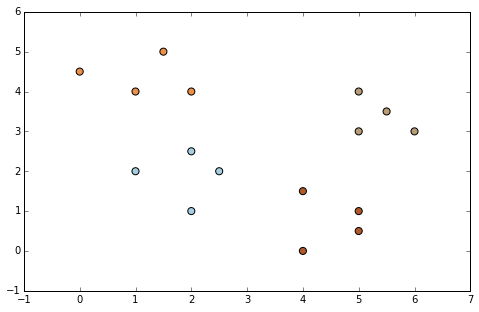

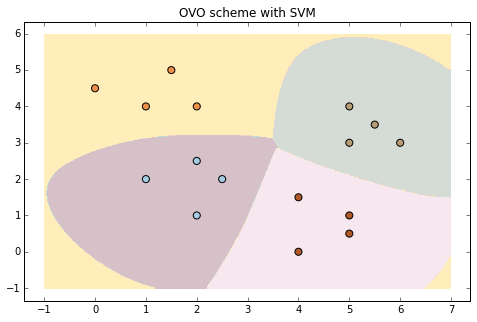

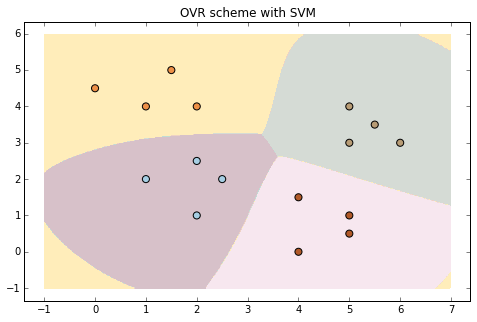

Data set generated with make_classification() using 20 samples


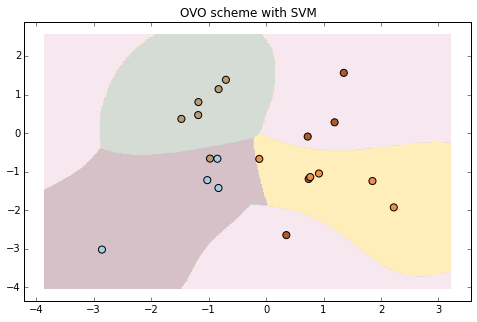

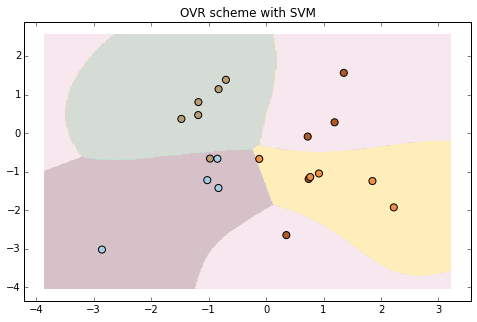

In [42]:
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5   # 10 inches in width, 5 in height

four_class_X = sp.array([[2,1],[2,2.5],[1,2],[2.5,2],[5.5,3.5],[5,4],[6,3],[5,3], [1,4],[1.5,5],[2,4],[0,4.5], [4,0],[5,0.5],[4,1.5],[5,1]])
four_class_y = sp.array([0,0,0,0,1,1,1,1,2,2,2,2,3,3,3,3])
plot_problem(four_class_X, four_class_y)
plt.show()

# OVO is default scheme for K-multiclass SVM == (KC2) classificators
clf_ovo = SVC(kernel='rbf')
clf_ovo.fit(four_class_X, four_class_y)
plot_problem(four_class_X, four_class_y, h=clf_ovo.predict)
plt.title("OVO scheme with SVM")
plt.legend()
plt.show()

# OVR scheme with SVM == K classificators
classif_ovr = OneVsRestClassifier(SVC(kernel='rbf'))
classif_ovr.fit(four_class_X, four_class_y)
plot_problem(four_class_X, four_class_y, h=classif_ovr.predict)
plt.title("OVR scheme with SVM")
plt.legend()
plt.show()

# OVO K=4 #classificators = (4C2) = 6
# OVR K=4 #classificators = 4
# OVO je bolji jer će naći najveću marginu između 2 klase za svaki par dviju klasa što znači 
# da će najbolje generalizirati za novi primjer u koju klasu spada

print "Data set generated with make_classification() using 20 samples"
data_four_X, data_four_y = make_classification(n_samples=20, n_features=2, n_informative=2, n_redundant=0, 
                           n_repeated=0, n_classes=4, n_clusters_per_class=1)

# OVO is default scheme for K-multiclass SVM == (KC2) classificators
clf_ovo_data = SVC(kernel='rbf')
clf_ovo_data.fit(data_four_X, data_four_y)
plot_problem(data_four_X, data_four_y, h=clf_ovo_data.predict)
plt.title("OVO scheme with SVM")
plt.legend()
plt.show()

# OVR scheme with SVM == K classificators
classif_ovr_data = OneVsRestClassifier(SVC(kernel='rbf'))
classif_ovr_data.fit(data_four_X, data_four_y)
plot_problem(data_four_X, data_four_y, h=classif_ovr_data.predict)
plt.title("OVR scheme with SVM")
plt.legend()
plt.show()

**Q:** Koliko je binarnih klasifikatora trenirano u ovom slučaju?

**Q:** Što su prednosti, a što nedostatci sheme OVO nad shemom OVR? Što mislite, zašto je shema OVO bolji izbor za SVM od sheme OVR?